In [2]:
%cd /kaggle
from IPython.display import clear_output
pat = input('Personal Access Token:')
clear_output()
! git clone https://$pat@github.com/qAp/nfl_helmet_assignment_kaggle.git

Cloning into 'nfl_helmet_assignment_kaggle'...
remote: Enumerating objects: 8, done.
remote: Counting objects: 100% (8/8), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 8 (delta 1), reused 8 (delta 1), pack-reused 0
Unpacking objects: 100% (8/8), done.


In [11]:
import os, sys
import importlib
import numpy as np
import pandas as pd
import cv2
import matplotlib
import matplotlib.pyplot as plt
from IPython.display import display, Video

sys.path.append('/kaggle/nfl_helmet_assignment_kaggle/')
from helmet_tracker.util import check_submission
from helmet_tracker.util import NFLAssignmentScorer
from helmet_tracker.util import video_with_baseline_boxes
from helmet_tracker.util import add_track_features
from helmet_tracker.util import create_football_field

In [4]:
# Read in data files
BASE_DIR = '/kaggle/input/nfl-health-and-safety-helmet-assignment'

# Labels and sample submission
labels = pd.read_csv(f'{BASE_DIR}/train_labels.csv')
ss = pd.read_csv(f'{BASE_DIR}/sample_submission.csv')

# Player tracking data
tr_tracking = pd.read_csv(f'{BASE_DIR}/train_player_tracking.csv')
te_tracking = pd.read_csv(f'{BASE_DIR}/test_player_tracking.csv')

# Baseline helmet detection labels
tr_helmets = pd.read_csv(f'{BASE_DIR}/train_baseline_helmets.csv')
te_helmets = pd.read_csv(f'{BASE_DIR}/test_baseline_helmets.csv')

# Extra image labels
img_labels = pd.read_csv(f'{BASE_DIR}/image_labels.csv')

# Checking that submission is valid

In [19]:
check_submission(ss)

True

In [20]:
check_submission(labels)

Has more than 22 boxes in a single frame


False

In [18]:
check_submission(labels.query("isSidelinePlayer == False"))

True

# Scoring locally

In [21]:
scorer = NFLAssignmentScorer(labels)

In [28]:
# %%time
# # Score the sample submission
# ss_score = scorer.score(ss)
# print(f'Sample submission scores: {ss_score:0.4f}')

Sample submission scores: 0.0000
CPU times: user 15.7 s, sys: 1.16 s, total: 16.9 s
Wall time: 16.9 s


In [25]:
# %%time
# # Score a submission with only impacts
# perfect_impacts = labels.query('isDefinitiveImpact == True and isSidelinePlayer == False')
# imp_score = scorer.score(perfect_impacts)
# print(f'A submission with perfect predictions only for impacts scores: {imp_score:0.4f}')

A submission with perfect predictions only for impacts scores: 0.6666
CPU times: user 15.7 s, sys: 1.23 s, total: 17 s
Wall time: 17 s


In [26]:
# %%time
# # Score a submission with only non-impacts
# perfect_nonimpacts = labels.query('isDefinitiveImpact == False and isSidelinePlayer == False')
# nonimp_score = scorer.score(perfect_nonimpacts)
# print(f'A submission with perfect predictions only for non-impacts scores: {nonimp_score:0.4f}')

A submission with perfect predictions only for non-impacts scores: 0.3334
CPU times: user 36.7 s, sys: 14.9 s, total: 51.6 s
Wall time: 50.3 s


In [27]:
# %%time
# # Score a perfect submission
# SUB_COLUMNS = ss.columns
# perfect_train = labels.query('isSidelinePlayer == False')[SUB_COLUMNS].copy()
# perfect_score = scorer.score(perfect_train)
# print(f'A perfrect training submission scores: {perfect_score:0.4f}')

A perfrect training submission scores: 1.0000
CPU times: user 36.6 s, sys: 13.5 s, total: 50.1 s
Wall time: 48.8 s


# Baseline helmet detection 

The competition host has a baseline helmet detection model, a model that takes an input image and outputs bounding boxes for helmets, along with the confidences.  This model is used to predict on the train and test frames, and the results are available to us.  Helmet bounding boxes will also be made available for the private test frames during submission.

In [7]:
example_video = '/kaggle/input/nfl-health-and-safety-helmet-assignment/train/57584_000336_Sideline.mp4'

output_video = video_with_baseline_boxes(video_path=example_video, 
                                         baseline_boxes=tr_helmets, gt_labels=labels)

Running for 57584_000336_Sideline


OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'
ffmpeg version 9c33b2f Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 9.3.0 (crosstool-NG 1.24.0.133_b0863d8_dirty)
  configuration: --prefix=/opt/conda --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1627813612080/_build_env/bin/x86_64-conda-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-gpl --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-libx264 --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --pkg-config=/home/conda/feedstock_root/build_artifacts/ffmpeg_1627813612080/_build_env/bin/pkg-config
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libav

In [9]:
frac = 0.65
display(Video(data=output_video, embed=True, height=int(frac * 750), width=int(frac * 1280)))

# NGS tracking data

In [5]:
tr_tracking = add_track_features(tr_tracking)
te_tracking = add_track_features(te_tracking)

In [7]:
game_play = "57584_000336"

In [8]:
example_tracks = tr_tracking.query('game_play == @game_play and isSnap == True')

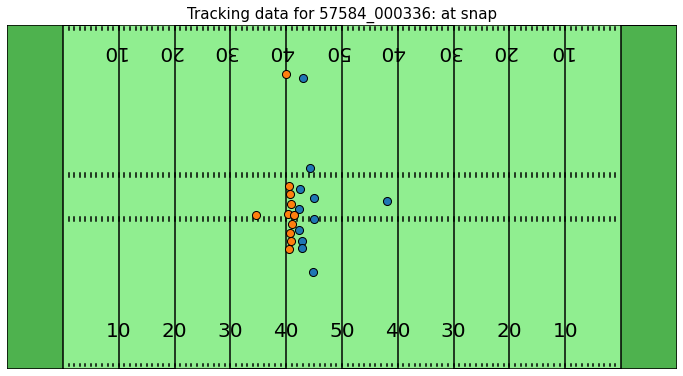

In [9]:
ax = create_football_field()
for team, d in example_tracks.groupby('team'):
    ax.scatter(d['x'], d['y'], label=team, s=65, lw=1, edgecolors='black', zorder=5)
    
ax.legend().remove()
ax.set_title(f"Tracking data for {game_play}: at snap", fontsize=15);

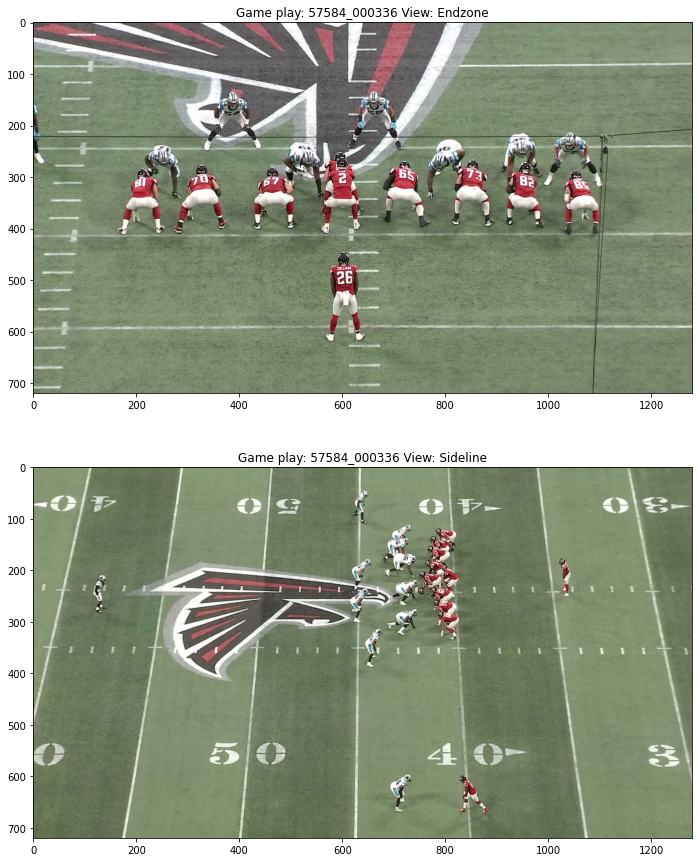

In [14]:
cap = cv2.VideoCapture(f'{BASE_DIR}/train/{game_play}_Endzone.mp4')
cap.get(10)
_, ez_snap_img = cap.read()

cap = cv2.VideoCapture(f'{BASE_DIR}/train/{game_play}_Sideline.mp4')
cap.get(10)
_, sl_snap_img = cap.read()

fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 15))
axs[0].imshow(cv2.cvtColor(ez_snap_img, cv2.COLOR_BGR2RGB))
axs[0].set_title(f'Game play: {game_play} View: Endzone')
axs[1].imshow(cv2.cvtColor(sl_snap_img, cv2.COLOR_BGR2RGB))
axs[1].set_title(f'Game play: {game_play} View: Sideline');